In [ ]:
# Python 3.12 is required for this. Use following commands to install the setup:

# RUN ALL these commands in TERMINAL, not in the notebook.
#!python3.12 -m venv .venv
#!.venv\scripts\activate

#!python -m pip install matplotlib
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras import layers

In [4]:
num_classes = 10
input_shape = (28,28,1)

(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)


print('x_train shape', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

x_train shape (60000, 28, 28, 1)
60000 train samples
10000 test samples


In [5]:
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

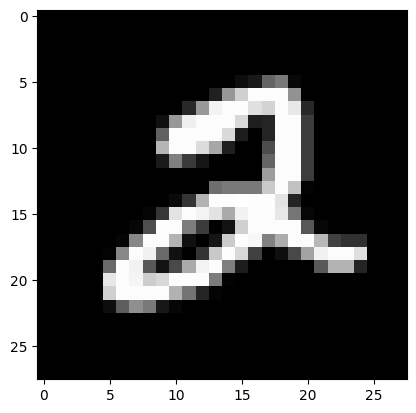

True label = 2


In [6]:
sample_number = 5
image = x_train[sample_number]
plt.imshow(image, cmap='gray')
plt.show()

print('True label =', np.argmax(y_train[sample_number]))

In [7]:
model = keras.Sequential(
    [
        keras.Input(shape=input_shape),
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(), # 5*5*24=1600
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation="softmax"),
    ]
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 11, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │        16,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,826 (136.04 KB)

 Trainable params: 34,826 (136.04 KB)

 Non-trainable params: 0 (0.00 B)

In [8]:
batch_size = 128
epochs = 15

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.1)

Epoch 1/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.8826 - loss: 0.3830 - val_accuracy: 0.9760 - val_loss: 0.0886
Epoch 2/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9634 - loss: 0.1191 - val_accuracy: 0.9833 - val_loss: 0.0583
Epoch 3/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9725 - loss: 0.0895 - val_accuracy: 0.9880 - val_loss: 0.0472
Epoch 4/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9769 - loss: 0.0753 - val_accuracy: 0.9888 - val_loss: 0.0420
Epoch 5/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9801 - loss: 0.0638 - val_accuracy: 0.9890 - val_loss: 0.0415
Epoch 6/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9813 - loss: 0.0588 - val_accuracy: 0.9880 - val_loss: 0.0414
Epoch 7/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9834 - loss: 0.0526 - val_accuracy: 0.9893 - val_loss: 0.0364
Epoch 8/15
422/422 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9845 - loss: 0.0484 - val_accuracy: 0.

In [9]:
test_loss, test_accuracy = model.evaluate(x_test, y_test, verbose=1)
print(test_loss)
print(test_accuracy)

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.9918 - loss: 0.0237
0.02373926155269146
0.9918000102043152


In [10]:
history_dict = history.history
#history_dict

In [11]:
accuracy = history_dict['accuracy']
validation_accuracy = history_dict['val_accuracy']
loss = history_dict['loss']
validation_loss = history_dict['val_loss']

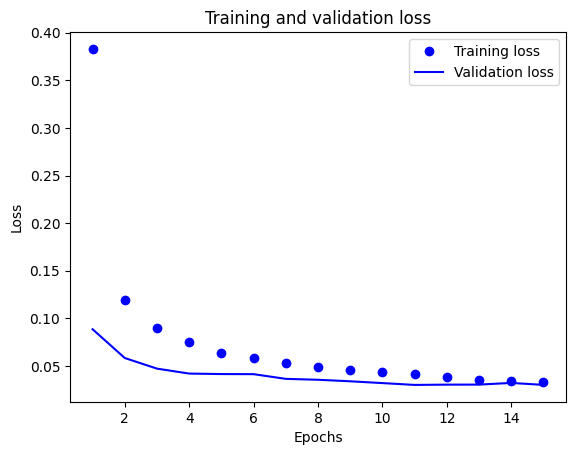

In [12]:
epochs = range(1, len(accuracy)+1)

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, validation_loss, 'b', label= "Validation loss")
plt.title("Training and validation loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

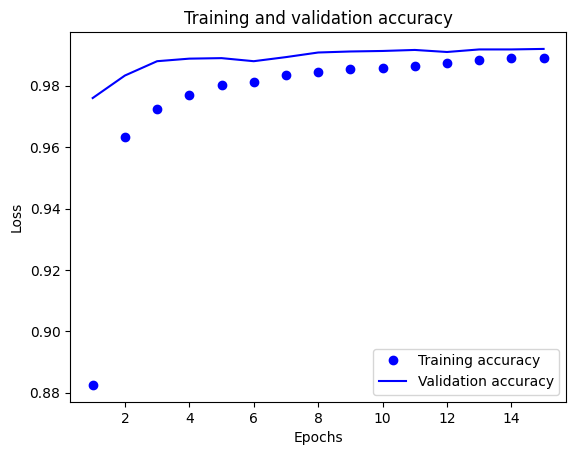

In [13]:
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, validation_accuracy, 'b', label= "Validation accuracy")
plt.title("Training and validation accuracy")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [14]:
predictions = model.predict(x_test)

sample_number2 = 9999
print(predictions[sample_number2])
print('Prediction =', np.argmax([predictions[sample_number2]]) )
print('True label =', np.argmax(y_test[sample_number2]))

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step
[2.7224840e-07 1.8618024e-12 2.6098260e-07 1.3955006e-08 5.5525302e-08
 1.9032557e-07 9.9999762e-01 2.7353257e-14 1.5334792e-06 4.3534308e-11]
Prediction = 6
True label = 6


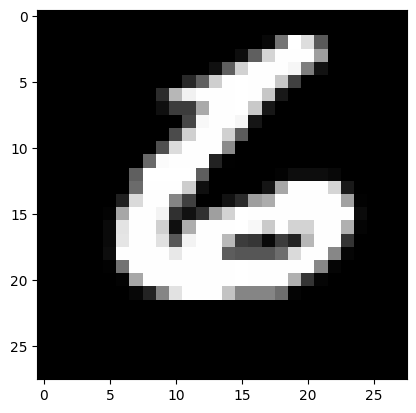

In [15]:
image2 = x_test[sample_number2]
plt.imshow(image2, cmap='grey')
plt.show()

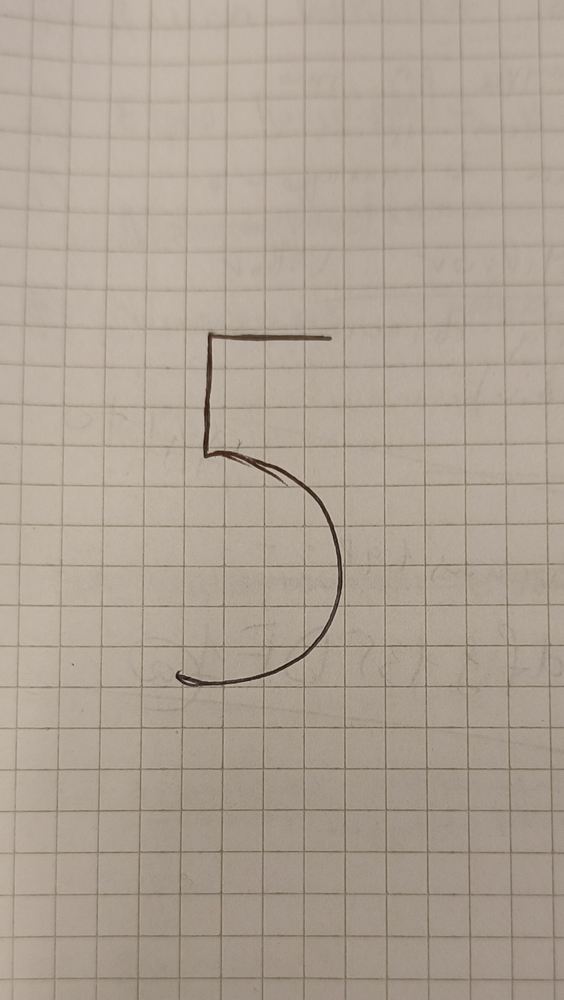

In [29]:
from PIL import Image, ImageOps

image_path = "C:\\Users\\ma053309\\Desktop\\kuvanluokittelu\\viisi.jpg"
image3 = Image.open(image_path)
image3

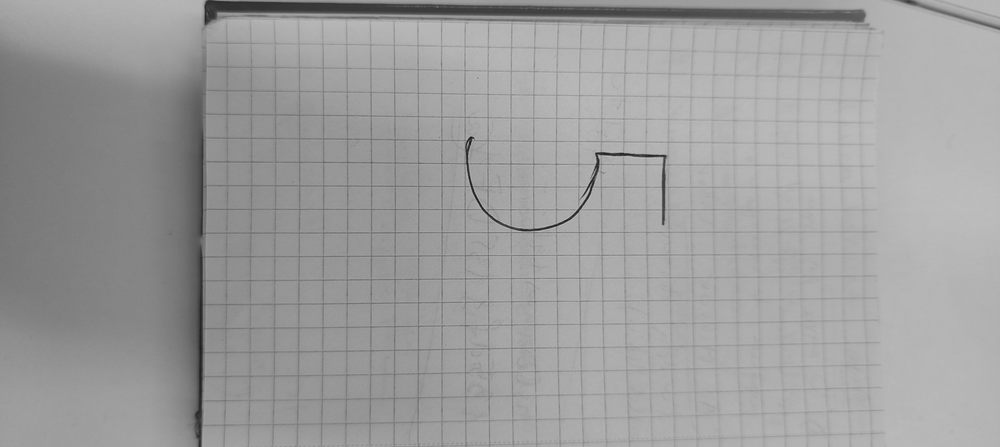

In [17]:
image_gray = image3.convert('L')
image_gray

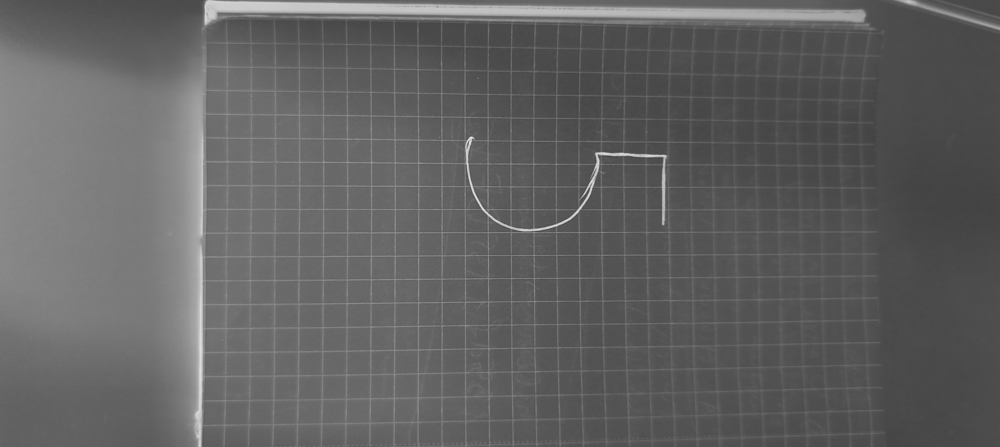

In [18]:
image_inverted = ImageOps.invert(image_gray)
image_inverted

In [19]:
image_resized = image_inverted.resize((28,28))
image_resized

In [20]:
image_array = np.array(image_resized)
image_array

array([[ 88,  83,  80,  78,  73, 112, 180, 170, 167, 167, 165, 161, 160,
        157, 156, 153, 149, 146, 144, 140, 137, 133, 129, 122,  88,  95,
         99,  81],
       [ 96,  90,  86,  84,  82, 104, 100,  88,  87,  89,  91,  92,  96,
         99, 103, 105, 107, 111, 112, 112, 114, 117, 117, 121,  92,  72,
         83,  99],
       [108,  99,  93,  90,  91,  99,  96,  89,  84,  82,  80,  78,  75,
         75,  75,  76,  76,  75,  75,  76,  76,  76,  77,  78,  79,  75,
         73,  74],
       [124, 113, 103,  96,  97, 110, 105,  97,  92,  89,  88,  86,  81,
         78,  77,  78,  77,  77,  79,  79,  78,  80,  80,  80,  79,  75,
         74,  73],
       [133, 127, 119, 108, 106, 121, 112, 104,  99,  95,  93,  92,  87,
         82,  80,  77,  76,  77,  78,  77,  77,  78,  78,  79,  78,  75,
         74,  74],
       [136, 132, 127, 120, 121, 133, 114, 109, 102,  98,  95,  93,  89,
         84,  82,  77,  75,  77,  76,  76,  75,  75,  75,  76,  76,  75,
         74,  74],
       [13

In [21]:
image_array_normalized = image_array/255.0
image_array_normalized

array([[0.34509804, 0.3254902 , 0.31372549, 0.30588235, 0.28627451,
        0.43921569, 0.70588235, 0.66666667, 0.65490196, 0.65490196,
        0.64705882, 0.63137255, 0.62745098, 0.61568627, 0.61176471,
        0.6       , 0.58431373, 0.57254902, 0.56470588, 0.54901961,
        0.5372549 , 0.52156863, 0.50588235, 0.47843137, 0.34509804,
        0.37254902, 0.38823529, 0.31764706],
       [0.37647059, 0.35294118, 0.3372549 , 0.32941176, 0.32156863,
        0.40784314, 0.39215686, 0.34509804, 0.34117647, 0.34901961,
        0.35686275, 0.36078431, 0.37647059, 0.38823529, 0.40392157,
        0.41176471, 0.41960784, 0.43529412, 0.43921569, 0.43921569,
        0.44705882, 0.45882353, 0.45882353, 0.4745098 , 0.36078431,
        0.28235294, 0.3254902 , 0.38823529],
       [0.42352941, 0.38823529, 0.36470588, 0.35294118, 0.35686275,
        0.38823529, 0.37647059, 0.34901961, 0.32941176, 0.32156863,
        0.31372549, 0.30588235, 0.29411765, 0.29411765, 0.29411765,
        0.29803922, 0.2980

In [22]:
image_array_final = np.expand_dims(image_array_normalized, axis=-1)
image_array_final.shape

(28, 28, 1)

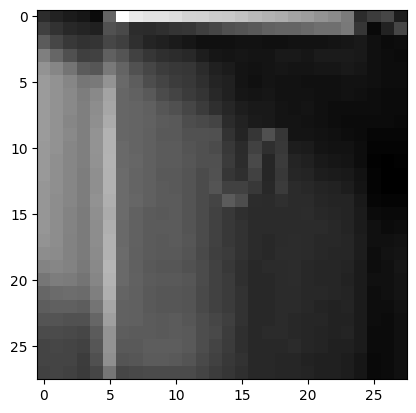

In [23]:
plt.imshow(image_array_final, cmap='gray')
plt.show()

In [24]:
image_array_final2 = np.expand_dims(image_array_final, axis=0)
image_array_final2.shape

(1, 28, 28, 1)

In [25]:
mypredict = model.predict(image_array_final2)
print(mypredict.round(2))
predicted_class = np.argmax(mypredict, axis=1)
print("Predicted class:", predicted_class[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
[[0.11 0.07 0.09 0.05 0.09 0.04 0.37 0.09 0.04 0.04]]
Predicted class: 6


313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 835us/step
Predictions to 1: [7.9071316e-07 3.5179846e-06 9.9999106e-01 1.7554001e-08 4.2248979e-11
 4.2489108e-13 4.5371971e-06 4.0663445e-12 1.0279787e-07 6.2840363e-13]
Predicted class 2
True class 2


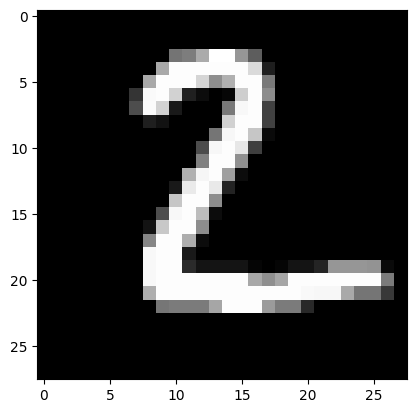

Predictions to 2: [1.2811024e-07 9.9988174e-01 2.5432530e-06 6.3352438e-08 7.1587499e-05
 8.1753818e-08 5.5656019e-06 2.7957871e-05 9.7740103e-06 5.3597898e-07]
Predicted class 1
True class 1


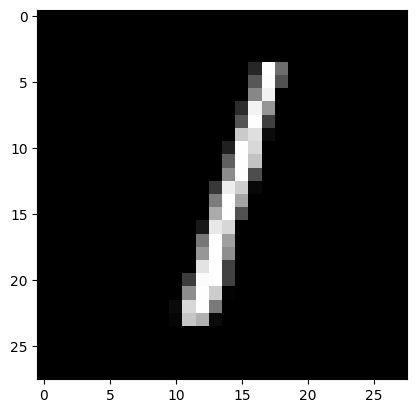

Predictions to 3: [9.9934715e-01 4.6577885e-12 7.6939405e-06 7.3018462e-09 3.9941302e-08
 2.7375421e-07 6.3306256e-04 4.7477624e-08 8.6343325e-06 3.1640702e-06]
Predicted class 0
True class 0


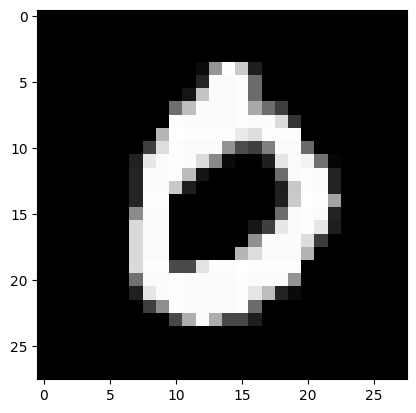

Predictions to 4: [1.6428832e-10 7.4533426e-12 7.1393780e-11 6.3205764e-12 9.9999785e-01
 1.8048766e-11 6.6873873e-10 8.6189225e-09 4.2772115e-09 2.1600629e-06]
Predicted class 4
True class 4


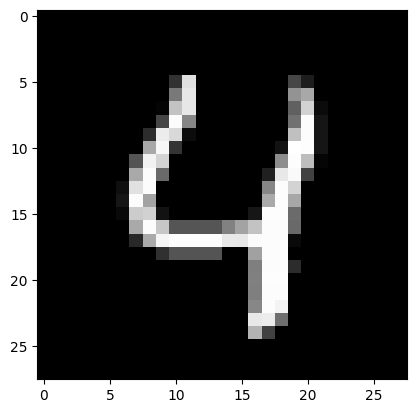

Predictions to 5: [2.9243137e-07 9.9991655e-01 2.2914915e-06 2.7537785e-08 2.6719457e-05
 4.4393875e-09 6.7807969e-07 4.3366363e-05 8.5102220e-06 1.5212307e-06]
Predicted class 1
True class 1


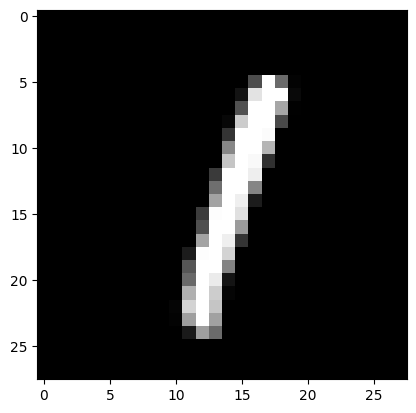

Predictions to 6: [3.2018217e-13 3.5546890e-09 4.5120898e-09 2.6457022e-11 9.9802566e-01
 1.1833279e-06 2.2604009e-11 2.3949025e-07 1.3786753e-03 5.9426751e-04]
Predicted class 4
True class 4


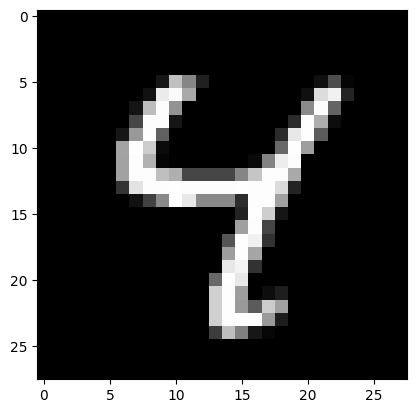

Predictions to 7: [8.2084464e-13 2.1555607e-10 3.0046451e-08 1.3172987e-06 2.2584636e-04
 2.0054824e-06 1.5465001e-11 3.7964051e-10 1.9686117e-05 9.9975115e-01]
Predicted class 9
True class 9


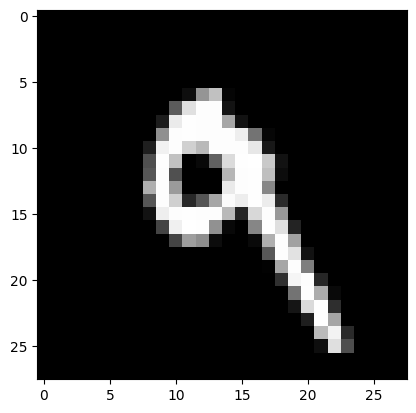

Predictions to 8: [3.5274475e-08 8.6503721e-16 7.4807854e-10 7.9019175e-10 2.2774196e-10
 9.9869859e-01 7.8017259e-04 9.2713667e-12 5.2031846e-04 8.4069086e-07]
Predicted class 5
True class 5


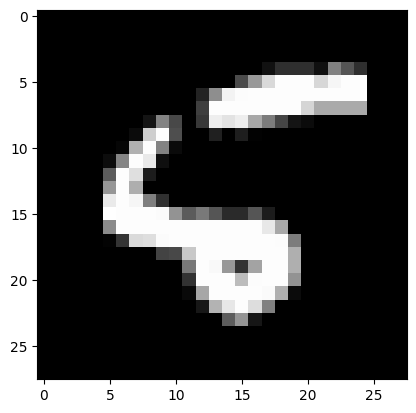

Predictions to 9: [2.1027584e-10 9.2398979e-12 1.3413512e-08 7.8057502e-07 1.0810292e-04
 8.2269821e-08 1.4415404e-12 6.9443864e-05 3.6754837e-04 9.9945408e-01]
Predicted class 9
True class 9


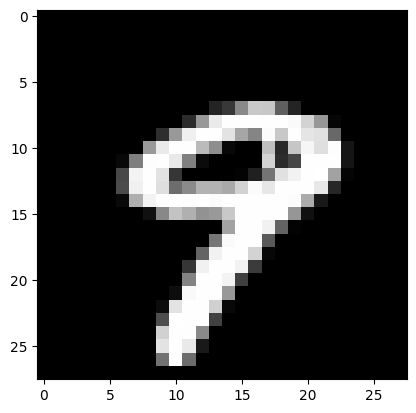

Predictions to 10: [9.9999869e-01 1.1425830e-16 3.5567240e-07 3.0335873e-11 1.3160753e-13
 3.6036374e-10 7.9248693e-08 6.1779498e-11 2.9680816e-08 8.8324242e-07]
Predicted class 0
True class 0


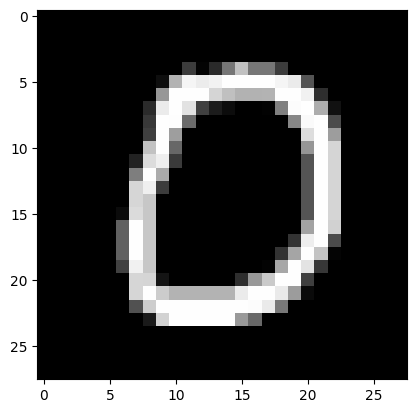

In [26]:
predictions2 = model.predict(x_test)

for sample_number3 in range(1,11):
    print(f"Predictions to {sample_number3}:", predictions2[sample_number3])
    predicted_class2 = np.argmax(predictions2[sample_number3])
    true_class = np.argmax(y_test[sample_number3])
    
    print("Predicted class", predicted_class2)
    print("True class", true_class)
    image4 = x_test[sample_number3]
    plt.imshow(image4, cmap='gray')
    plt.show()